Importing the Dependencies

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline 
import cufflinks as cf
import plotly
from plotly.offline import init_notebook_mode,iplot,plot
init_notebook_mode(connected=True)
cf.go_offline()
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import accuracy_score
import seaborn as sns


Data Collection & Analysis

In [2]:
# loading the data from csv file to a Pandas DataFrame
parkinsons_data = pd.read_csv('parkinsons_data.csv')

In [3]:
# printing the first 5 rows of the dataframe
parkinsons_data.head()

,Patient Id,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,...,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE,Level,status
0,P1,1,72,0,5.6431,28.199,34.398,0.00662,0.000034,0.00401,...,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006,Low,1.0
1,P2,1,72,0,12.6660,28.447,34.894,0.00300,0.000017,0.00132,...,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810,High,1.0
2,P3,1,72,0,19.6810,28.695,35.389,0.00481,0.000025,0.00205,...,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014,High,1.0
3,P4,1,72,0,25.6470,28.905,35.810,0.00528,0.000027,0.00191,...,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277,High,1.0
4,P5,1,72,0,33.6420,29.187,36.375,0.00335,0.000020,0.00093,...,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361,High,1.0


In [4]:
parkinsons_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Patient Id     5875 non-null   object 
 1   subject#       5875 non-null   int64  
 2   age            5875 non-null   int64  
 3   sex            5875 non-null   int64  
 4   test_time      5875 non-null   float64
 5   motor_UPDRS    5875 non-null   float64
 6   total_UPDRS    5875 non-null   float64
 7   Jitter(%)      5875 non-null   float64
 8   Jitter(Abs)    5875 non-null   float64
 9   Jitter:RAP     5875 non-null   float64
 10  Jitter:PPQ5    5875 non-null   float64
 11  Jitter:DDP     5875 non-null   float64
 12  Shimmer        5875 non-null   float64
 13  Shimmer(dB)    5875 non-null   float64
 14  Shimmer:APQ3   5875 non-null   float64
 15  Shimmer:APQ5   5875 non-null   float64
 16  Shimmer:APQ11  5875 non-null   float64
 17  Shimmer:DDA    5875 non-null   float64
 18  NHR     

In [5]:
parkinsons_data.drop(['Patient Id'],axis = 1,inplace=True)

In [6]:
# parkinsons_data['level']

In [7]:
parkinsons_data['Level'].replace('Medium','High',inplace=True)

C:\Users\taffa\AppData\Local\Temp\ipykernel_35192\2179281588.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [8]:
parkinsons_data['Level'].replace('High','1',inplace=True)
parkinsons_data['Level'].replace('Low','0',inplace=True)


C:\Users\taffa\AppData\Local\Temp\ipykernel_35192\2428517128.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\taffa\AppData\Local\Temp\ipykernel_35192\2428517128.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=

In [9]:
parkinsons_data.head()

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE,Level,status
0,1,72,0,5.6431,28.199,34.398,0.00662,0.000034,0.00401,0.00317,...,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006,0,1.0
1,1,72,0,12.6660,28.447,34.894,0.00300,0.000017,0.00132,0.00150,...,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810,1,1.0
2,1,72,0,19.6810,28.695,35.389,0.00481,0.000025,0.00205,0.00208,...,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014,1,1.0
3,1,72,0,25.6470,28.905,35.810,0.00528,0.000027,0.00191,0.00264,...,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277,1,1.0
4,1,72,0,33.6420,29.187,36.375,0.00335,0.000020,0.00093,0.00130,...,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361,1,1.0


In [10]:
parkinsons_data['Level'] = pd.to_numeric(parkinsons_data['Level'])

In [11]:
# number of rows and columns in the dataframe
parkinsons_data.shape

(5875, 24)

In [12]:
parkinsons_data.isnull()

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE,Level,status
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5870,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5871,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5872,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5873,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [13]:
parkinsons_data.isnull().any()

subject#         False
age              False
sex              False
test_time        False
motor_UPDRS      False
total_UPDRS      False
Jitter(%)        False
Jitter(Abs)      False
Jitter:RAP       False
Jitter:PPQ5      False
Jitter:DDP       False
Shimmer          False
Shimmer(dB)      False
Shimmer:APQ3     False
Shimmer:APQ5     False
Shimmer:APQ11    False
Shimmer:DDA      False
NHR              False
HNR              False
RPDE             False
DFA              False
PPE              False
Level            False
status            True
dtype: bool

In [14]:
parkinsons_data.isnull().sum()

subject#         0
age              0
sex              0
test_time        0
motor_UPDRS      0
total_UPDRS      0
Jitter(%)        0
Jitter(Abs)      0
Jitter:RAP       0
Jitter:PPQ5      0
Jitter:DDP       0
Shimmer          0
Shimmer(dB)      0
Shimmer:APQ3     0
Shimmer:APQ5     0
Shimmer:APQ11    0
Shimmer:DDA      0
NHR              0
HNR              0
RPDE             0
DFA              0
PPE              0
Level            0
status           3
dtype: int64

<Axes: >

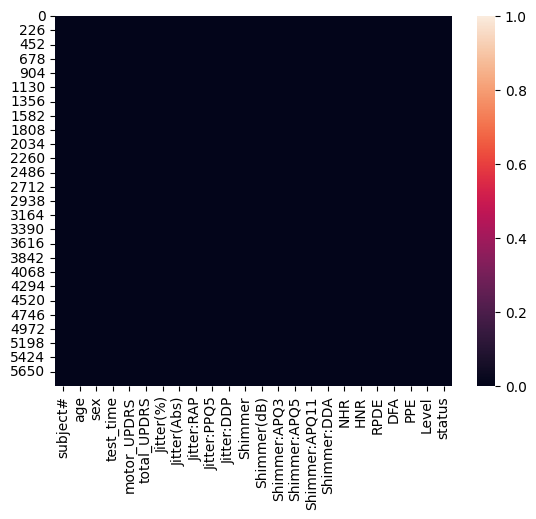

In [15]:
import seaborn as sns
sns.heatmap(parkinsons_data.isnull())

<Axes: xlabel='HNR', ylabel='count'>

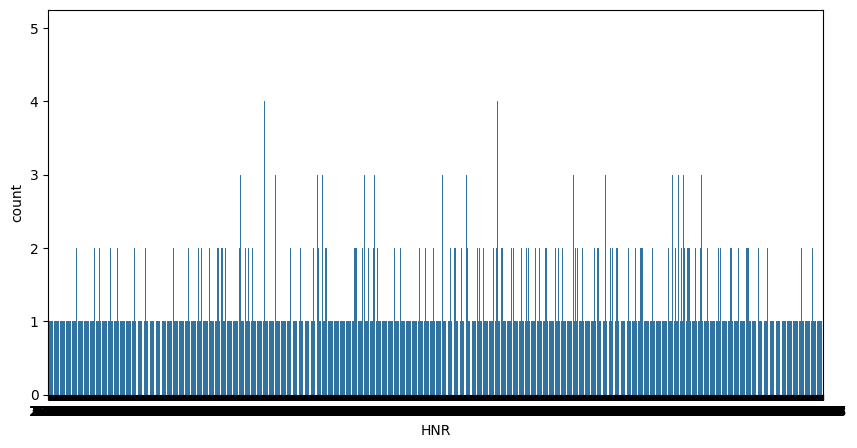

In [16]:
plt.figure(figsize=(10,5))
sns.countplot(x='HNR',data=parkinsons_data)

<Axes: xlabel='DFA', ylabel='count'>

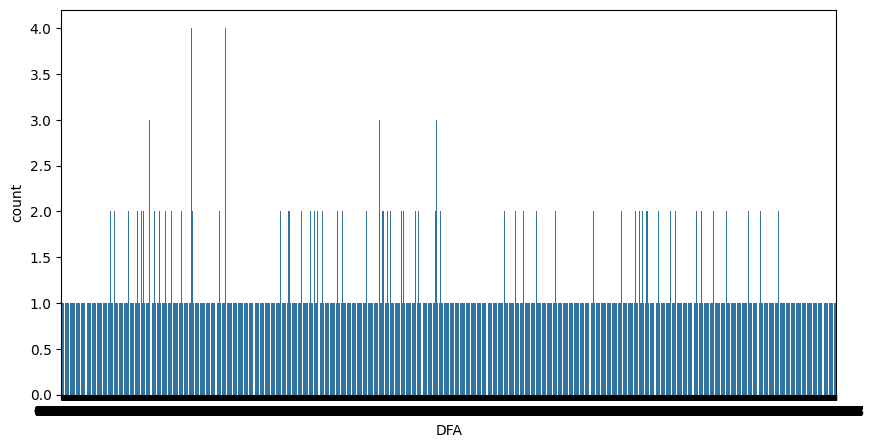

In [17]:
plt.figure(figsize=(10,5))
sns.countplot(x='DFA',data = parkinsons_data)

<Axes: xlabel='DFA', ylabel='age'>

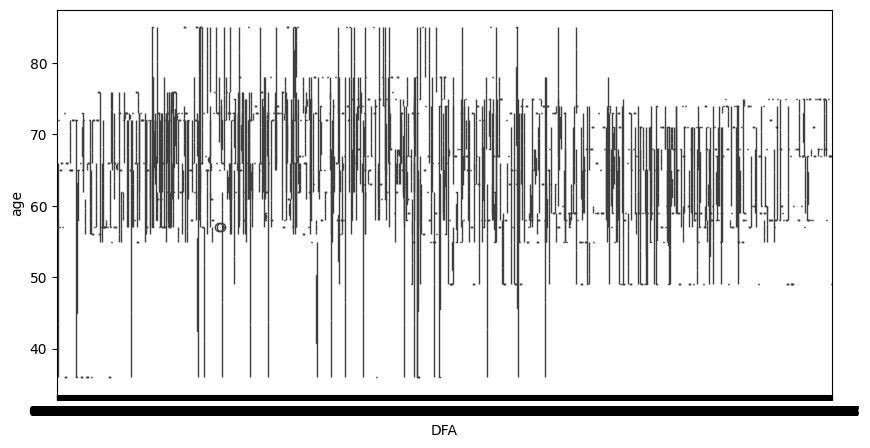

In [18]:
plt.figure(figsize=(10,5))
sns.boxplot(x='DFA',y='age',data = parkinsons_data)

<Axes: xlabel='HNR', ylabel='age'>

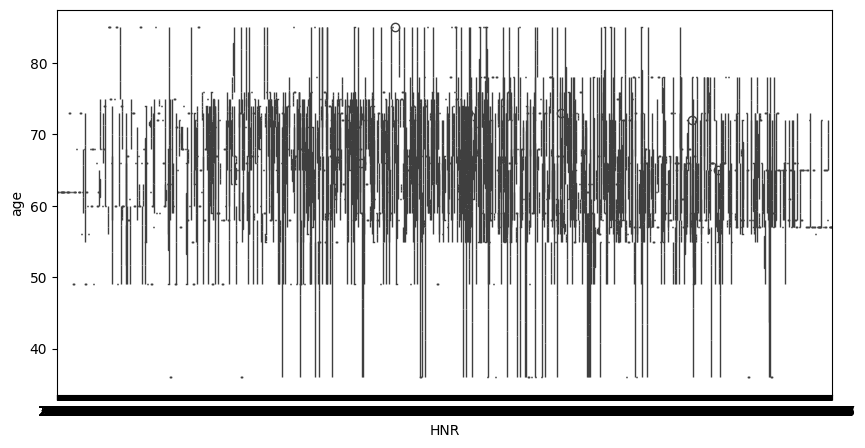

In [19]:
plt.figure(figsize=(10,5))
sns.boxplot(x='HNR',y='age',data = parkinsons_data)

In [20]:
sorted_smokers = parkinsons_data.groupby('age')['DFA'].count().to_frame()

In [21]:
sorted_smokers.style.background_gradient(cmap = 'Reds')

,DFA
age,
36,101
49,256
55,267
56,140
57,385
58,429
59,299
60,156
61,150


In [22]:
parkinsons_data.style.background_gradient(cmap = 'Reds')

In [23]:
label = parkinsons_data.age.sort_values().unique()       
target = sorted_smokers.DFA


In [24]:
print(label)
print(target)

[36 49 55 56 57 58 59 60 61 62 63 65 66 67 68 71 72 73 74 75 76 78 85]
age
36    101
49    256
55    267
56    140
57    385
58    429
59    299
60    156
61    150
62    236
63    156
65    407
66    422
67    283
68    317
71    165
72    310
73    385
74    271
75    286
76    144
78    168
85    142
Name: DFA, dtype: int64


In [25]:
print(sorted_smokers.columns)


Index(['DFA'], dtype='object')


In [26]:
import plotly.graph_objects as go

In [27]:
label = parkinsons_data.age.sort_values().unique()       
target = sorted_smokers.DFA


In [28]:
fig = go.Figure()
fig.add_trace(go.Bar(x=label,y=target))
fig.update_layout(title = 'Parkinsons Patient',xaxis=dict(title='Age'),yaxis=dict(title='DDA'))
fig.show()

## RandomForest Classifier

In [29]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=label,y=target,mode='markers+lines'))
fig.update_layout(title = 'Parkinsons Patients',xaxis=dict(title='Age'),yaxis=dict(title='DDA'))
fig.show()

In [30]:
import numpy as np

In [31]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import log_loss, f1_score
from sklearn.model_selection import cross_val_score
import numpy as np 
acc_dict = {}
# create the data
X = parkinsons_data.drop('age',axis = 1)
y = parkinsons_data['Level']
X_train, X_test, y_train, y_test = train_test_split(X,y)

Accuracy score :  100.0


C:\Users\taffa\AppData\Local\Temp\ipykernel_35192\1979220311.py:14: RuntimeWarning:

divide by zero encountered in log



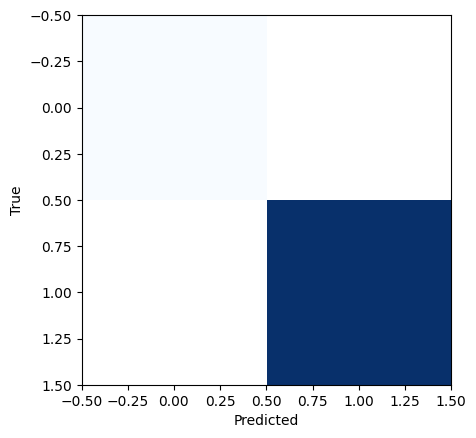

In [32]:
from sklearn.ensemble import  RandomForestClassifier
# create model
model = RandomForestClassifier()

# fit the data in the model
model.fit(X_train,y_train)

y_pred_randomF = model.predict(X_test)
print('Accuracy score : ',accuracy_score(y_test, y_pred_randomF)*100)

acc_dict['RFC_log_loss'] = log_loss(y_test, y_pred_randomF)
acc_dict['RFC_F!1_Score'] = f1_score(y_test, y_pred_randomF,average='weighted')
# prediction visualization
plt.imshow(np.log(confusion_matrix(y_test,y_pred_randomF)),cmap = 'Blues',interpolation = 'nearest')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.show()

## KNeighbourClassifier

Best k is 11 with score 0.6781656589991274
Accuracy score on test set: 0.6820966643975493
Log Loss: 11.458397639698918
F1 Score: 0.5985220245601316


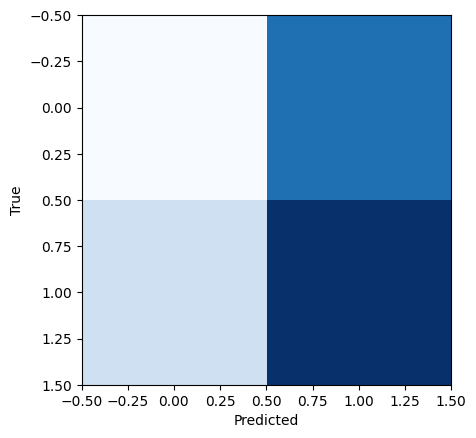

In [33]:
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, log_loss, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

# Instantiate SimpleImputer with mean strategy
imputer = SimpleImputer(strategy='mean')

# Impute missing values in X_train and X_test
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Initialize variables to store the best k and its corresponding score
best_k = 0
high_score = 0

# Iterate over different values of k
for k in range(3, 12):
    # Create KNN classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=k)
    
    # Perform cross-validation
    scores = cross_val_score(knn, X_train_imputed, y_train, cv=5)  # Assuming 5-fold cross-validation
    score = scores.mean()  # Compute mean score
    
    # Update best k and its corresponding score if current score is higher
    if score > high_score:
        high_score = score
        best_k = k

print('Best k is {} with score {}'.format(best_k, high_score))

# Fit KNN classifier with the best k on the entire training set
knn = KNeighborsClassifier(n_neighbors=best_k)
knn.fit(X_train_imputed, y_train)

# Make predictions on the test set
y_pred = knn.predict(X_test_imputed)

# Compute accuracy score
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy score on test set:', accuracy)

# Compute log loss
logloss = log_loss(y_test, y_pred)
print('Log Loss:', logloss)

# Compute F1 score
f1score = f1_score(y_test, y_pred, average='weighted')
print('F1 Score:', f1score)

# Plot confusion matrix
plt.imshow(np.log(confusion_matrix(y_test, y_pred)), cmap='Blues', interpolation='nearest')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.show()


## KMeans Clustering

Accuracy score: 0.48944860449285227


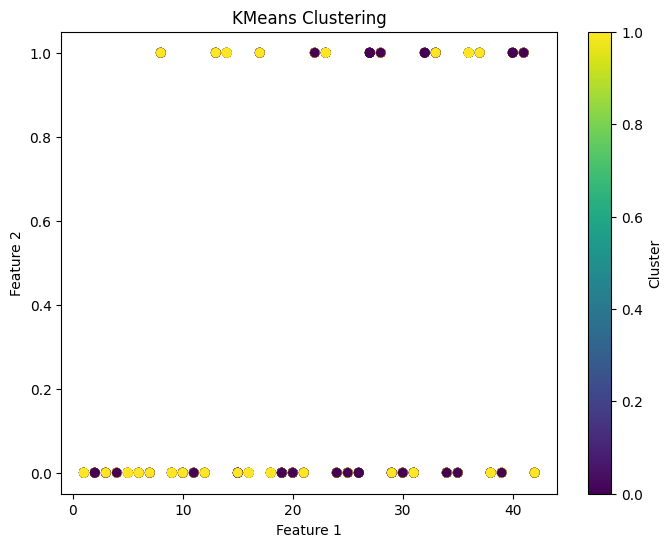

In [34]:
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score
import numpy as np

# Assuming X_train, X_test, y_train, y_test are your training and test data
# Replace them with your actual data

# Handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Initialize KMeans model
kmeans = KMeans(n_clusters=2)  # Assuming 2 clusters, you can adjust this number

# Fit KMeans model on the imputed training data
kmeans.fit(X_train_imputed)

# Predict clusters for the test data
clusters = kmeans.predict(X_test_imputed)

# Calculate accuracy score (if true labels are available)
accuracy = accuracy_score(y_test, clusters)  # Replace y_test with your actual labels
print('Accuracy score:', accuracy)

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.scatter(X_test_imputed[:, 0], X_test_imputed[:, 1], c=clusters, cmap='viridis')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('KMeans Clustering')
plt.colorbar(label='Cluster')
plt.show()


## Decision Tree Classifier

Accuracy score :  100.0


C:\Users\taffa\AppData\Local\Temp\ipykernel_35192\1182936360.py:10: RuntimeWarning:

divide by zero encountered in log



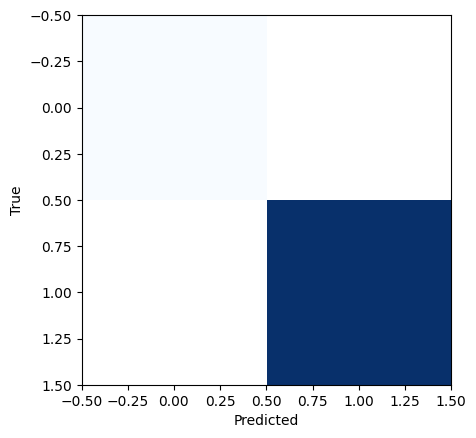

In [35]:
from sklearn.tree import DecisionTreeClassifier
tree_ = DecisionTreeClassifier()
tree_.fit(X_train,y_train)
y_pred = tree_.predict(X_test)
print('Accuracy score : ',accuracy_score(y_test, y_pred)*100)
acc_dict['Tree_log_loss'] = log_loss(y_test,y_pred)
acc_dict['Tree_f!1_score'] = f1_score(y_test,y_pred)

# prediction visualization
plt.imshow(np.log(confusion_matrix(y_test,y_pred)),cmap = 'Blues',interpolation = 'nearest')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.show()

## Support Vector Classifier

Accuracy score : 70.25187202178353


C:\Users\taffa\AppData\Local\Temp\ipykernel_35192\4228291085.py:18: RuntimeWarning:

divide by zero encountered in log



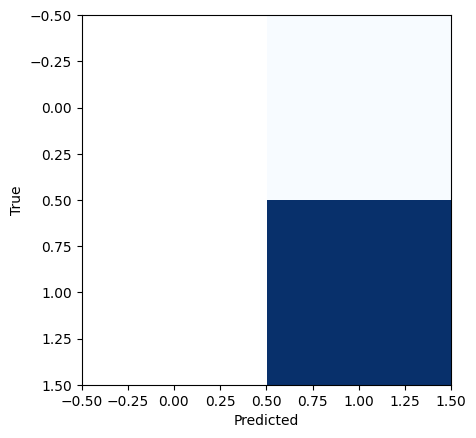

In [36]:
from sklearn.impute import SimpleImputer
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)

model = SVC()
model.fit(X_train_imputed, y_train)

X_test_imputed = imputer.transform(X_test)
y_pred = model.predict(X_test_imputed)

accuracy = accuracy_score(y_test, y_pred)
print('Accuracy score :', accuracy * 100)

# prediction visualization
plt.imshow(np.log(confusion_matrix(y_test,y_pred)),cmap = 'Blues',interpolation = 'nearest')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.show()


In [37]:
# getting more information about the dataset
parkinsons_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 24 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   subject#       5875 non-null   int64  
 1   age            5875 non-null   int64  
 2   sex            5875 non-null   int64  
 3   test_time      5875 non-null   float64
 4   motor_UPDRS    5875 non-null   float64
 5   total_UPDRS    5875 non-null   float64
 6   Jitter(%)      5875 non-null   float64
 7   Jitter(Abs)    5875 non-null   float64
 8   Jitter:RAP     5875 non-null   float64
 9   Jitter:PPQ5    5875 non-null   float64
 10  Jitter:DDP     5875 non-null   float64
 11  Shimmer        5875 non-null   float64
 12  Shimmer(dB)    5875 non-null   float64
 13  Shimmer:APQ3   5875 non-null   float64
 14  Shimmer:APQ5   5875 non-null   float64
 15  Shimmer:APQ11  5875 non-null   float64
 16  Shimmer:DDA    5875 non-null   float64
 17  NHR            5875 non-null   float64
 18  HNR     

In [38]:
# checking for missing values in each column
parkinsons_data.isnull().sum()

subject#         0
age              0
sex              0
test_time        0
motor_UPDRS      0
total_UPDRS      0
Jitter(%)        0
Jitter(Abs)      0
Jitter:RAP       0
Jitter:PPQ5      0
Jitter:DDP       0
Shimmer          0
Shimmer(dB)      0
Shimmer:APQ3     0
Shimmer:APQ5     0
Shimmer:APQ11    0
Shimmer:DDA      0
NHR              0
HNR              0
RPDE             0
DFA              0
PPE              0
Level            0
status           3
dtype: int64

In [39]:
# getting some statistical measures about the data
parkinsons_data.describe()

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE,Level,status
count,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,...,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5872.000000
mean,21.494128,64.804936,0.317787,92.863722,21.296229,29.018942,0.006154,0.000044,0.002987,0.003277,...,0.020144,0.027481,0.051467,0.032120,21.679495,0.541473,0.653240,0.219589,0.695319,0.744891
std,12.372279,8.821524,0.465656,53.445602,8.129282,10.700283,0.005624,0.000036,0.003124,0.003732,...,0.016664,0.019986,0.039711,0.059692,4.291096,0.100986,0.070902,0.091498,0.460311,0.435960
min,1.000000,36.000000,0.000000,-4.262500,5.037700,7.000000,0.000830,0.000002,0.000330,0.000430,...,0.001940,0.002490,0.004840,0.000286,1.659000,0.151020,0.514040,0.021983,0.000000,0.000000
25%,10.000000,58.000000,0.000000,46.847500,15.000000,21.371000,0.003580,0.000022,0.001580,0.001820,...,0.010790,0.015665,0.027830,0.010955,19.406000,0.469785,0.596180,0.156340,0.000000,0.000000
50%,22.000000,65.000000,0.000000,91.523000,20.871000,27.576000,0.004900,0.000034,0.002250,0.002490,...,0.015940,0.022710,0.041110,0.018448,21.920000,0.542250,0.643600,0.205500,1.000000,1.000000
75%,33.000000,72.000000,1.000000,138.445000,27.596500,36.399000,0.006800,0.000053,0.003290,0.003460,...,0.023755,0.032715,0.061735,0.031463,24.444000,0.614045,0.711335,0.264490,1.000000,1.000000
max,42.000000,85.000000,1.000000,215.490000,39.511000,54.992000,0.099990,0.000446,0.057540,0.069560,...,0.167020,0.275460,0.488020,0.748260,37.875000,0.966080,0.865600,0.731730,1.000000,1.000000


In [40]:
# distribution of target Variable
parkinsons_data['status'].value_counts()

status
1.0    4374
0.0    1498
Name: count, dtype: int64

1  --> Parkinson's Positive

0 --> Healthy


In [41]:
# grouping the data bas3ed on the target variable
parkinsons_data.groupby("status").mean()

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE,Level
status,,,,,,,,,,,,,,,,,,,,,
0.0,21.730307,62.919893,0.426569,94.411740,21.886686,29.287835,0.007113,0.000049,0.003459,0.004054,...,0.019774,0.024168,0.031910,0.059323,0.049508,20.824213,0.550320,0.651603,0.228460,0.678238
1.0,21.416324,65.453818,0.280293,92.329521,21.097441,28.929943,0.005826,0.000042,0.002826,0.003011,...,0.016262,0.018771,0.025972,0.048785,0.026178,21.970849,0.538528,0.653809,0.216611,0.700960


Data Pre-Processing

Separating the features & Target

In [42]:
X = parkinsons_data.drop(columns=['age','status'], axis=1)
Y = parkinsons_data['status']

In [43]:
print(X)

      subject#  sex  test_time  motor_UPDRS  total_UPDRS  Jitter(%)  \
0            1    0     5.6431       28.199       34.398    0.00662   
1            1    0    12.6660       28.447       34.894    0.00300   
2            1    0    19.6810       28.695       35.389    0.00481   
3            1    0    25.6470       28.905       35.810    0.00528   
4            1    0    33.6420       29.187       36.375    0.00335   
...        ...  ...        ...          ...          ...        ...   
5870        42    0   142.7900       22.485       33.485    0.00406   
5871        42    0   149.8400       21.988       32.988    0.00297   
5872        42    0   156.8200       21.495       32.495    0.00349   
5873        42    0   163.7300       21.007       32.007    0.00281   
5874        42    0   170.7300       20.513       31.513    0.00282   

      Jitter(Abs)  Jitter:RAP  Jitter:PPQ5  Jitter:DDP  ...  Shimmer:APQ3  \
0        0.000034     0.00401      0.00317     0.01204  ...       0.01

In [44]:
print(Y)

0       1.0
1       1.0
2       1.0
3       1.0
4       1.0
       ... 
5870    1.0
5871    1.0
5872    1.0
5873    1.0
5874    1.0
Name: status, Length: 5875, dtype: float64


Splitting the data to training data & Test data

In [45]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [46]:
print(X.shape, X_train.shape, X_test.shape)

(5875, 22) (4700, 22) (1175, 22)


Model Training

Support Vector Machine Model

In [47]:
model = svm.SVC(kernel='linear')

In [48]:
import numpy as np

# Check for NaN values in Y_train
nan_indices = np.isnan(Y_train)

# Remove samples with NaN labels
X_train_clean = X_train[~nan_indices]
Y_train_clean = Y_train[~nan_indices]

# Now, train your model with the cleaned or imputed data
model.fit(X_train_clean, Y_train_clean)


SVC(kernel='linear')

In [49]:
# # training the SVM model with training data
# model.fit(X_train, Y_train)

In [50]:
import numpy as np
from sklearn.metrics import accuracy_score

# Assuming you have already trained your model and obtained predictions
# Replace `model` with the variable name of your trained model
X_train_prediction = model.predict(X_train)

# Check for NaN values in Y_train
nan_indices = np.isnan(Y_train)

# Remove samples with NaN labels
Y_train_clean = Y_train[~nan_indices]
X_train_prediction_clean = X_train_prediction[~nan_indices]

# Calculate accuracy score on cleaned data
training_data_accuracy = accuracy_score(Y_train_clean, X_train_prediction_clean)


Model Evaluation

Accuracy Score

In [51]:
import numpy as np
from sklearn.metrics import accuracy_score

# Check for NaN values in Y_train
nan_indices = np.isnan(Y_train)

# Remove samples with NaN labels
Y_train_clean = Y_train[~nan_indices]
X_train_prediction_clean = X_train_prediction[~nan_indices]

# Calculate accuracy score on cleaned data
training_data_accuracy = accuracy_score(Y_train_clean, X_train_prediction_clean)


In [52]:
# # accuracy score on training data
# X_train_prediction = model.predict(X_train)
# training_data_accuracy = accuracy_score(Y_train, X_train_prediction)

In [53]:
print('Accuracy score of training data : ', training_data_accuracy)

Accuracy score of training data :  0.7511177347242921


In [54]:
# accuracy score on training data
X_test_prediction = model.predict(X_test)
test_data_accuracy = accuracy_score(Y_test, X_test_prediction)

In [55]:
print('Accuracy score of test data : ', test_data_accuracy)

Accuracy score of test data :  0.7514893617021277


Building a Predictive System

In [ ]:
# input_data = (197.07600,206.89600,192.05500,0.00289,0.00001,0.00166,0.00168,0.00498,0.01098,0.09700,0.00563,0.00680,0.00802,0.01689,0.00339,26.77500,0.422229,0.741367,-7.348300,0.177551,1.743867,0.085569)
input_data = (1,72,0,5.6431,28.199,34.398,0.00662,3.3845,0.00401,0.00317,0.01204,0.02565,0.23,0.01438,0.01309,0.01662,0.04314)

# changing input data to a numpy array
input_data_as_numpy_array = np.asarray(input_data)

# reshape the numpy array
input_data_reshaped = input_data_as_numpy_array.reshape(1,-1)

prediction = model.predict(input_data_reshaped)
print(prediction)


if (prediction[0] == 0):
  print("The Person does not have Parkinsons Disease")

else:
  print("The Person has Parkinsons")


[1.]
The Person has Parkinsons


C:\Users\taffa\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but SVC was fitted with feature names



Saving the trained model

In [57]:
import pickle

In [58]:
filename = 'parkinsons_model.sav'
pickle.dump(model, open(filename, 'wb'))

In [59]:
# loading the saved model
loaded_model = pickle.load(open('parkinsons_model.sav', 'rb'))

In [60]:
for column in X.columns:
  print(column)

subject#
sex
test_time
motor_UPDRS
total_UPDRS
Jitter(%)
Jitter(Abs)
Jitter:RAP
Jitter:PPQ5
Jitter:DDP
Shimmer
Shimmer(dB)
Shimmer:APQ3
Shimmer:APQ5
Shimmer:APQ11
Shimmer:DDA
NHR
HNR
RPDE
DFA
PPE
Level


# Accuracy Report

|   Algorithm                  |   Accuracy score  |      
|------------------------------|-------------------|
|          RFC                 |      100.00       |       
|   Decision Tree Classifier   |      100.00       | 
|   Support Vector Classifier  |      70.00        |      
